# PodPicasso

<img src="https://drive.google.com/uc?id=1n1wHmG_mlA7IDyjrzAlq8mER2vah_VPc" />


Welcome to the week 2 for Building AI Products with OpenAI. In this weeks project, you are going to build a product that generates attractive images based on the contents of a podcast episode. Please read the [Objective](#scrollTo=jD5QswC6pt7r) section to get more details!

In this project, we will cover several steps including:

1. [Generate Podcast Cover Art from Titles](#scrollTo=kgA5CiYNq8Rl)
2. [Generate Podcast Cover Art from Episode Description](#scrollTo=mNU6xXnkrYGG)
3. [Model Prompting Techniques](#scrollTo=yvI-c18AsFup)
4. [Deployment](#scrollTo=SajZnU5ir8hZ)
5. [Extensions](#scrollTo=6mh8kB9KxM_v)

<a href="https://colab.research.google.com/github/sidhusmart/CoRise_Prompt_Design_Course/blob/cohort3/Week_1/CoRise_Week1_StudentVersion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Objective

The cover art of a podcast is the first thing that a user will view when landing on the podcast page or searching on any pocast player. Having a well designed and attractive podcast cover image can help to attract eyeballs and potentially a larger audience.

You might have noticed that most podcasts have a standard cover image which is then repeated for every listed episode. While this ensures recognition of a common brand, it can also be repetitive and boring. One of the reasons for this is because designing and generating cover images for every podcast episode can be tedious and time-consuming. Especially when you are not an artist or don't have easy access to one. Let's try to build an AI product that provides a service to generate cover images for any given podcast episode.

# Setup

## Installing Project Dependencies

Before proceeding further, let's take the opportunity to install the necessary libraries. We will make use of OpenAI (for prompting chatGPT) and Diffusers (this is a library from Huggingface that allows us to use StableDiffusion based models for image generation).

In [1]:
!pip uninstall typing-extensions -y
!pip uninstall gradio -y
!pip install typing_extensions==4.7.1
!pip install gradio
!pip install feedparser
!pip install diffusers transformers accelerate invisible_watermark accelerate safetensors
!pip install openai
!pip install tiktoken
!pip install opencv-python
!pip install httpx==0.27.2

Found existing installation: typing_extensions 4.12.2
Uninstalling typing_extensions-4.12.2:
  Successfully uninstalled typing_extensions-4.12.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.5.1+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is incompatible.
torch 2.5.1+cu124 requires nvidia-cuda-cupti-cu12==12.4.127; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cuda-cupti-cu12 12.5.82 which is incompatible.
torch 2.5.1+cu124 requires nvidia-cuda-nvrtc-cu12==12.4.127; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cuda-nvrtc-cu12 12.5.82 which is incompatible.
torch 2.5.1+cu124 requires nvidia-cuda-runtime-cu12==12.4.127; platform_system == "Linux" and platform_machine == "x86_6

## Setting up OpenAI API Key

<div style="
  padding: 10px;
  border-radius: 5px;
  background-color: #ffcccc;
  border-left: 6px solid #ff0000;
  margin-bottom: 20px;">
  
  <strong>⚠️ Important Notice:</strong>
  <p>Do not share or use this API Key outside of the context of the notebook exercises.</p>
</div>

Uplimit has provisioned an OpenAI API Key for your projects. Please add this API Key to this assignment by clicking on the Security Key icon on the left hand tab of the Google Colab notebook and then add a new parameter value called `OPENAI_API_KEY`.


 Here you can provide the API key that you copied and this will not be part of your Google Colab account. You can also enable the toggle Notebook access - this will allow your notebook to have access to this API key.

<img src="https://drive.google.com/uc?id=1PXceUExMVUSLzkf9dh-w2Qo8d6hyEii0" />

After the API Key has been setup, run the following code:

In [2]:
from openai import OpenAI
from google.colab import userdata

client = OpenAI(api_key=userdata.get('OPENAI_API_KEY'))

### Setting up Stable Diffusion functions

We will use StableDiffusion as our image generation model. This is an open-source model and allows us to control several parameters (including the seed number) allowing us to generate an image again if required. StableDiffusion is available in multiple versions with the latest being SDXL 1.0. We will use the SDXL base variant in this project but there are several other types of models that you can experiment with which we will highlight in the Extensions section.

In [3]:
from diffusers import DiffusionPipeline
import torch

base_sdxl = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
base_sdxl.to("cuda")
base_sdxl.enable_attention_slicing()

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:86: UserWarning: 
Access to the secret `HF_TOKEN` has not been granted on this notebook.
You will not be requested again.
Please restart the session if you want to be prompted again.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [4]:
# Drop global variable - base_sdxl
def generate_sdxl_base_image(prompt, negative_prompt="", seed=42):
  torch.manual_seed(seed)
  return base_sdxl(prompt, negative_prompt=negative_prompt).images[0]

# Generate Podcast Cover Art from Titles

Good cover images are attractive and paint a picture of what the user can expect to hear in that podcast. In order to generate these images, we must first try to figure out what the episode is about and what is being discussed.

There are several ways in which you can get information about the podcast:

- Using the title of the podcast episode
- Using the episode description or show notes
- Using transcripts to identify key highlights or generating a summary

Starting with just the title of the episode, let's determine if we can create attractive album art using the SDXL image generation model for some of the podcast episodes. We setup a random seed at the start which will allow us to regenerate and get the same image at anytime in the future if we use the same parameters. This is an important capability that is possible only with open-source models like StableDiffusion.

We use the episode title direcly in the prompt with the added prefix of "Podcast cover image with title "

You can use the episode title direcly in the prompt or with any added prefix of your choice, for e.g. `Podcast cover image of ...`

### 👨‍🏫 Learner Task:

Please provide the RSS feed URL for the podcast that you would like to generate cover art for.

In [5]:
import feedparser
intelligence_feed = feedparser.parse("https://media.rss.com/number9thenursery/feed.xml")
print ("The number of podcast entries is ", len(intelligence_feed.entries))

The number of podcast entries is  7


In [6]:
podcast_title = intelligence_feed.entries[0].title
print (podcast_title)

Weaning your Baby with Dr Janet Aylott


### 👨‍🏫 Learner Task:

Please input your first version of the prompt for generating podcast cover images using the podcast episode title. You can use something like `Podcast cover image with title ...`

  0%|          | 0/50 [00:00<?, ?it/s]

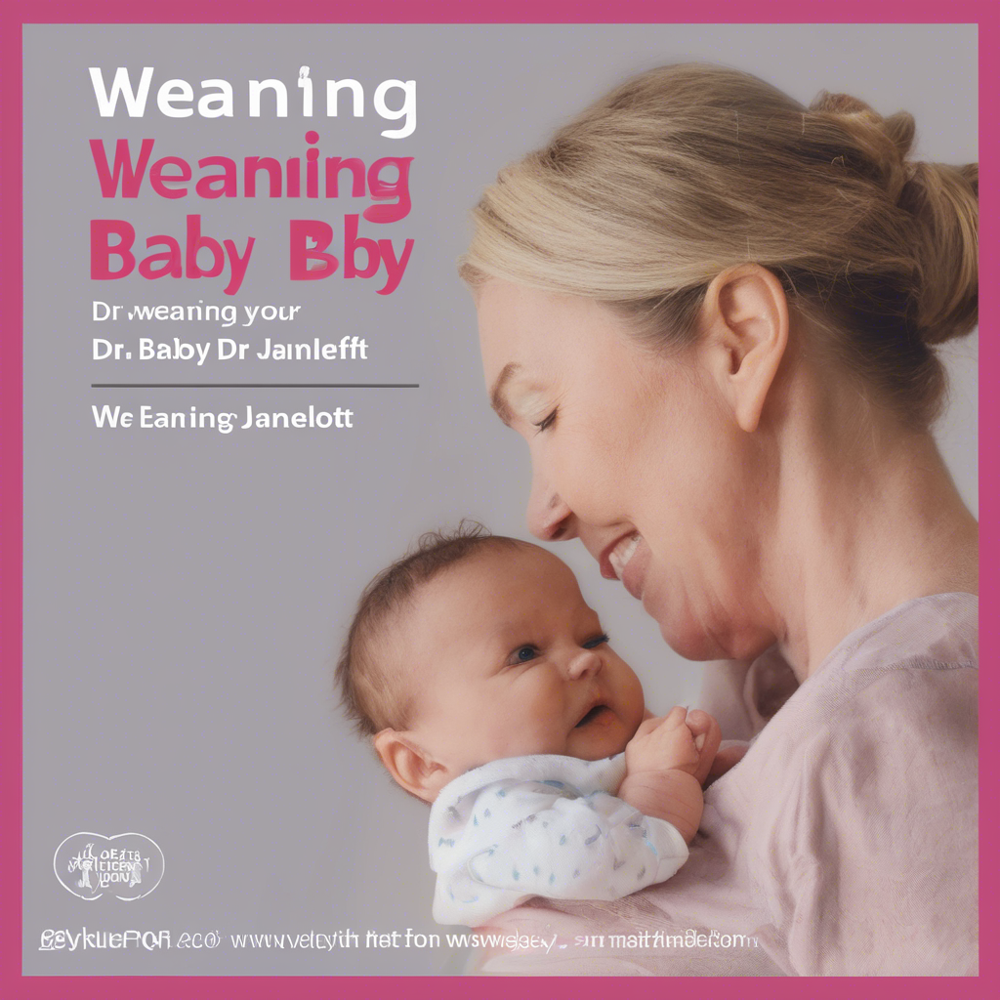

In [ ]:
prompt = "Podcast cover image with title 'Weaning your Baby with Dr Janet Aylott'"
generate_sdxl_base_image(prompt, seed=42)

You can generate multiple versions of this image by simply changing the random seed.

In [ ]:
prompt = "Podcast cover image with title 'Weaning your Baby with Dr Janet Aylott'"
generate_sdxl_base_image(prompt, seed=124)

Output hidden; open in https://colab.research.google.com to view.

You can also try with other podcast titles from earlier episodes by changing the index value and retrieving older titles.

Fussy Eaters - Dr Janet Aylott to the rescue!


  0%|          | 0/50 [00:00<?, ?it/s]

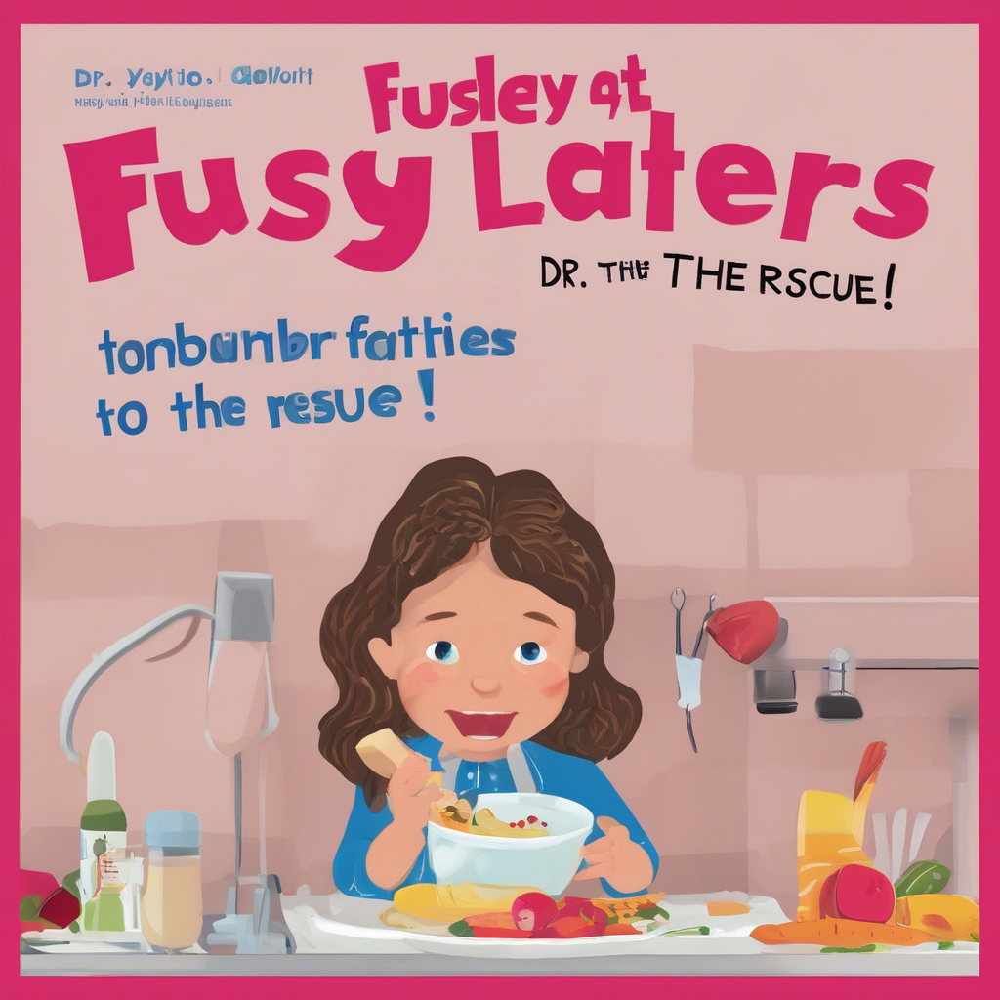

In [ ]:
podcast_title = intelligence_feed.entries[1].title
print (podcast_title)
prompt = f"Podcast cover image with title '{podcast_title}'"
generate_sdxl_base_image(prompt, seed=42)

By now you may have noticed some artifacts that are sometimes part of the image. Some examples include:

- Weird text in the image - incorrect spelling or just not making sense
- If human beings are generated then you might notice contorted face expressions or missing or incorrect limbs
- Sometimes you might get a black image due to an NSFW filter
- You might also notice errors in terms of the number of the max tokens in your prompt

This is quite common in image generation model and we have just started experimenting at this stage. As we build this product, we will see how many of these issues could be overcome.

In the following section, we will introduce a good practice to check the validity of our prompts by generating multiple images using the same prompt and varying the seed value. This is a common way of checking if the prompt that we have is working consistently or at least generating images along the lines of what are were hoping in our minds. This step takes longer to complete but is an advisable step when we start building these prompts for image generation models.

In [7]:
import numpy as np
import matplotlib.pyplot as plt

def generate_images(input_prompt):
  images = []
  for i in range(2):
    for j in range(2):
      seed_value = np.random.randint(0, 2**32 - 1)
      print (seed_value)
      image = generate_sdxl_base_image(prompt=input_prompt, seed=seed_value)
      images.append(image)

  fig, axes = plt.subplots(2, 2, figsize=(8, 8))

  for i, image in enumerate(images):
        row, col = i // 2, i % 2
        axes[row, col].imshow(image)
        axes[row, col].axis('off')
  plt.show()

### 👨‍🏫 Learner Task:

Please add your image prompt in the cell below to generate a series of 4 images based on different random seeds.

1841013781


  0%|          | 0/50 [00:00<?, ?it/s]

1138489615


  0%|          | 0/50 [00:00<?, ?it/s]

3551850485


  0%|          | 0/50 [00:00<?, ?it/s]

1002994234


  0%|          | 0/50 [00:00<?, ?it/s]

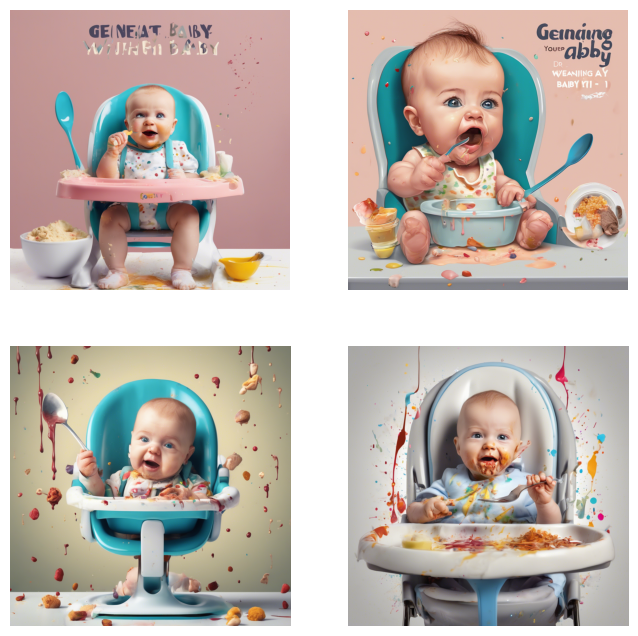

In [ ]:
# Call the function to generate and display the images
generate_images("Generate a podcast cover image for 'Weaning your Baby with Dr Janet Aylott'. The image shows a baby sitting in a highchair with a spoon in his hand and covered in food stains. Use realistic, 3d, cartoon style")

Please capture the main findings from your prompt experiments at this stage:

*   What kind of artifacts did you identify in the generated images?
*   Did the generations remain consistent acrossmultiple generations with different seeds?
*   Did you hit any other issues when generating images?
*   Do you already have some ideas for how the prompts could be improved?

# Generate Postcast Cover Art from Episode Description

It's possible that the episode titles on their own are not a great way to design our prompt. Let's go one step further and get more valuable information from the description, summary and possibly show notes of the podcast. Specifically, we are interested in the description section which looks something like this for the latest episode:

In [8]:
intelligence_feed.entries[0].description

"<p>Dr Janet Aylott, our resident Nutritionist,  walks us through the weaning process. We all want our children to have healthy relationships with food and Dr Janet Aylott's advice is fantastic! Don't forget to message us if you have any questions by emailing us at manager@number9thenursery.co.uk </p>"

Typically, there will be a lot of useful information on what is discussed in the episode along with timestamps! At the same time, there is also unnecessary information that won't help us like sponsored posts, social media links etc. We are interested in understanding the content of the episode that we could use in our image generation prompt, so let's see how we would use an LLM to extract the valuable piece of information from the description.

### 👨‍🏫 Learner Task:

Please adapt the prompts to suit your second style of image generation. This time we integrate an LLM to first clean-up/ adapt the description of the podcast episode.

In [9]:
instructPrompt = """
Design a cover image for a podcast episode, including specific visual elements that would effectively convey the essence of the content.
Use the following description of the podcast episode to generate the diffusion text prompt:
"""

In [10]:
podcast_description = "Dr Janet Aylott, our resident Nutritionist,  walks us through the weaning process. We all want our children to have healthy relationships with food and Dr Janet Aylott's advice is fantastic!"

In [11]:
requestMessage = instructPrompt + '\n' + podcast_description

In [12]:
chatOutput = client.chat.completions.create(model="gpt-4o-mini",
                                            messages=[{"role": "system", "content": "You are a helpful assistant."},
                                                      {"role": "user", "content": requestMessage}
                                                      ]
                                          )

In [13]:
episodePrompt = chatOutput.choices[0].message.content
print (episodePrompt)

Here’s a diffusion text prompt for designing a cover image for the podcast episode featuring Dr. Janet Aylott:

**Diffusion Text Prompt:**

"Create an engaging and colorful podcast cover image for an episode featuring Dr. Janet Aylott, a nutritionist discussing the weaning process for children. Visual elements should include: 

1. A warm and inviting color palette with soft pastels (pinks, light greens, yellows) to evoke a nurturing atmosphere.
2. An illustration of a happy, diverse family sitting around a table, with a baby in a high chair engaging with healthy foods (such as fruits and vegetables).
3. A prominent portrait of Dr. Janet Aylott, smiling and holding a plate of nutritious food, symbolizing her expertise and guidance.
4. Soft, playful typography for the episode title, integrating keywords like 'Weaning Process' and 'Healthy Relationships with Food.'
5. Subtle background elements like patterns of baby toys or kitchen utensils to emphasize the family-friendly theme.
6. Inclu

You should now have a very crisp definition of what the episode it about. Let's try to modify our prompt from before while continuing with the prefix.

### 👨‍🏫 Learner Task:

Please adapt the second style of image generation prompt where we use the description of the podcast episode rather than just the title. You could use something like `Podcast cover image for ...`

In [14]:
prompt="""Create an engaging podcast cover image for an episode talking about the weaning process.
Illustrate a nurturing scene of a parent and a baby sharing healthy foods.
"""

In [ ]:
generate_sdxl_base_image(prompt, seed=42)

Output hidden; open in https://colab.research.google.com to view.

It's very likely that you might see some errors from the image generation process:

* The model accepts only a maximum of 77 token in the input prompt. You might remember from our previous lecture that this is far more limited that ChatGPT. We need to keep this in mind while defining our prompts.
* You might also see the error message Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed. This means that in one of the cases the generated image did not adhere to the safety standards of the model providers.
* You may also notice the issue with generated text in the images becomes even more clearer. While some of the text looks attractive and similar to what one might find in a podcast, it's still gibberish!

You might have noticed that our strategy so far was to just dump the information about the podcast episode to the image generation model. This works to some extent but we are not really thinking about the design of our image. We are relying on the image generation model to figure out what we want based on words it sees.

Let's try a different strategy by leveraging the expertise of the LLM to help design an image cover for us.

### 👨‍🏫 Learner Task:

Now it is your task to create the third style of image generation prompt. First, we again integrate an LLM into the loop by using it for a brainstorming session to come up with a design concept. We also ask the LLM to create the prompt directly and then just send that to the SDXL image generation.

In [15]:
instructPrompt = """
Use the description of the podcast episode to brainstrom some design ideas for generating a cover image for the podcast.
Consider different styles and visual elements that would effectively convey the essence of the content.
For each idea, create the text prompt used for the diffusion model to generate the cover image.
Podcast description:
"""

In [16]:
requestMessage = instructPrompt + '\n' + podcast_description

In [17]:
chatOutput = client.chat.completions.create(model="gpt-4o-mini",
                                            messages=[{"role": "system", "content": "You are a helpful assistant."},
                                                      {"role": "user", "content": requestMessage}
                                                      ]
                                          )

In [ ]:
image_prompt = chatOutput.choices[0].message.content
print (image_prompt)

Here are some design ideas for generating a cover image for the podcast episode featuring Dr. Janet Aylott:

### Idea 1: Whimsical Child and Food Imagery
- **Visual Elements**: Illustrate a whimsical scene featuring a playful child surrounded by various colorful, healthy foods like fruits and vegetables. Incorporate animated elements like smiling carrots and apples to create an inviting atmosphere.
- **Style**: Bright, cheerful, and colorful cartoon style.
- **Text Prompt**: "A whimsical illustration of a happy child playing with vibrant fruits and vegetables, cartoon style, bright colors, cheerful atmosphere, emphasis on healthy foods, playful and inviting."

### Idea 2: Nature-inspired and Educational
- **Visual Elements**: Design a serene setting with a tree in the background, and a table in the foreground with a variety of healthy foods displayed. Include elements like a nutrition book or food guide next to Dr. Janet Aylott, who could be depicted as a friendly, knowledgeable figure

In [ ]:
image_prompt="""
A whimsical illustration of a happy baby playing with vibrant fruits and vegetables, cartoon style, bright colors, cheerful atmosphere, emphasis on healthy foods, playful and inviting."
"""

In [ ]:
generate_sdxl_base_image(image_prompt, seed=42)

Output hidden; open in https://colab.research.google.com to view.

In [18]:
image_prompt2="""
A minimalist cover design showing a divided plate with colorful healthy foods, silhouette of a parent feeding a child, clean lines, soft color palette, elegant typography, modern aesthetic."
"""

  0%|          | 0/50 [00:00<?, ?it/s]

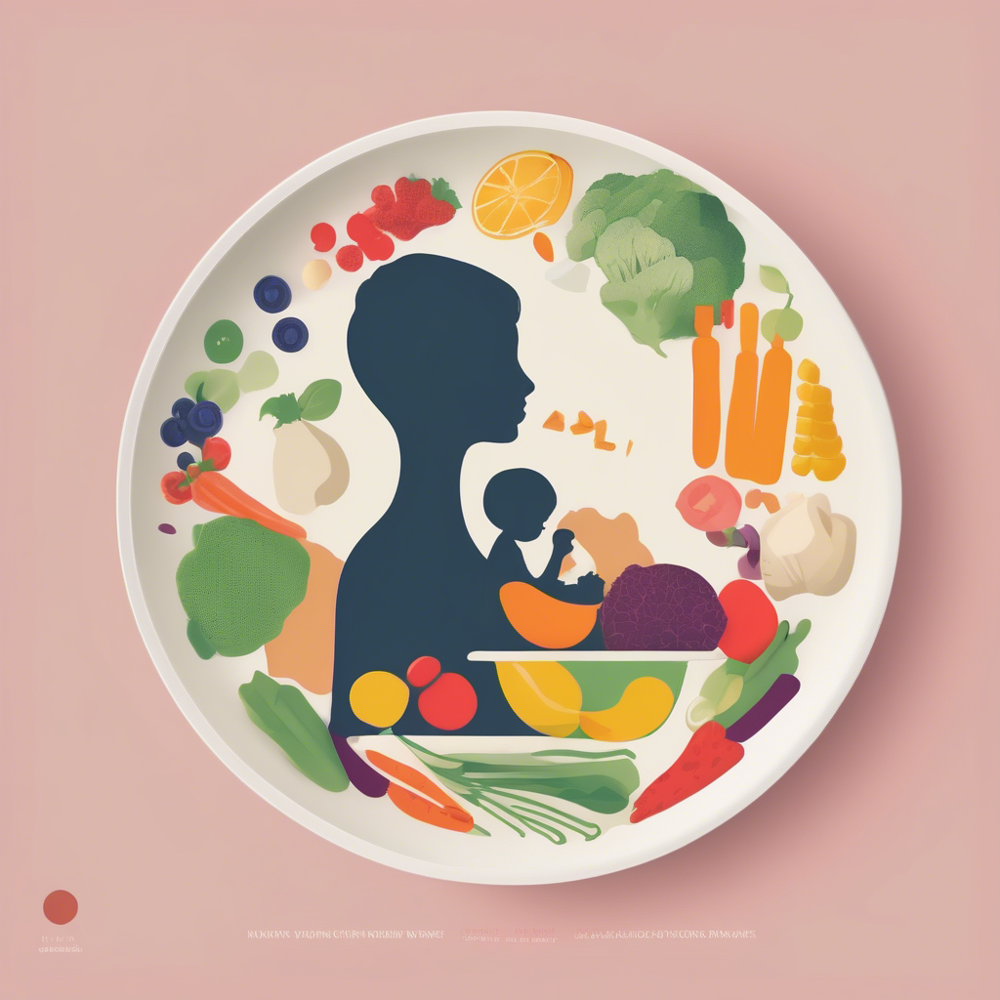

In [19]:
generate_sdxl_base_image(image_prompt2, seed=42)

The generated image is likely close to the design brief and depending on your taste, we might also consider using this as the episode cover. In this process we started by using the episode title or description directly and then modified our approach to instead use an LLM from OpenAI to summarize and then design the cover art for us.

As we have reached a set of experiments at this point, let's try to modularize our code and define them as functions that we can reuse as an image generation option in our product.

In [27]:
def image_generation_with_title(episode_title):
  image_prompt = "Podcast cover image with title - " + episode_title
  print (image_prompt)
  return generate_sdxl_base_image(image_prompt)

def get_episode_summary(episode_description):
  instructPrompt = """
      The following section contains the description of a podcast episode but it also includes a lot of irrelevant information like
      social media links, sponsor information, podcast player links, HTML tags, timestamps etc. Can you please remove irrelevant information and return only a summary that
      describes the podcast episode?
      """
  requestMessage = instructPrompt + '\n' + episode_description
  chatOutput = client.chat.completions.create(model="gpt-4o-mini",
                                                messages=[{"role": "system", "content": "You are a helpful assistant."},
                                                          {"role": "user", "content": requestMessage}
                                                          ]
                                                )
  return (chatOutput.choices[0].message.content)

def image_generation_with_description(episode_description):
  episode_summary = get_episode_summary(episode_description)
  image_prompt = "Podcast cover image for " + episode_summary
  print (image_prompt)
  return generate_sdxl_base_image(image_prompt)

def image_generation_with_prompt(episode_description):
  episode_summary = get_episode_summary(episode_description)
  instructPrompt = """
    Assume that you are a professional graphic art designer and artist. You have to design the album cover art for a podcast episode where you are given
    a brief summary of the host and the topics that are discussed in the podcast. You need to describe your idea for the album cover image very concisely
    in just one sentence and please limit yourself to 100 words. Please provide the image description only and none of your thoughts and ideas.
    Here are the details of the podcast episode:
    """
  requestMessage = instructPrompt + '\n' + episode_summary
  chatOutput = client.chat.completions.create(model="gpt-4o-mini",
                                                messages=[{"role": "system", "content": "You are a helpful assistant."},
                                                          {"role": "user", "content": requestMessage}
                                                          ]
                                                )
  image_prompt = chatOutput.choices[0].message.content
  print (image_prompt)
  return generate_sdxl_base_image(image_prompt)

In [21]:
intelligence_feed.entries[1].title

'Fussy Eaters - Dr Janet Aylott to the rescue!'

In [22]:
intelligence_feed.entries[1].description

'<p>Join us for an amazing podcast with Nutritionist <strong>Dr Janet Aylott </strong>as she walks us through how to restore peace at mealtimes and get your child enjoying food again.  Are you putting food on a pedestal? Honestly this is our favourite concept surrounding food with toddlers. </p>'

We can ensure that the functions we have defined work as expected by calling them directly for an episode.

Podcast cover image with title - Fussy Eaters - Dr Janet Aylott to the rescue!


  0%|          | 0/50 [00:00<?, ?it/s]

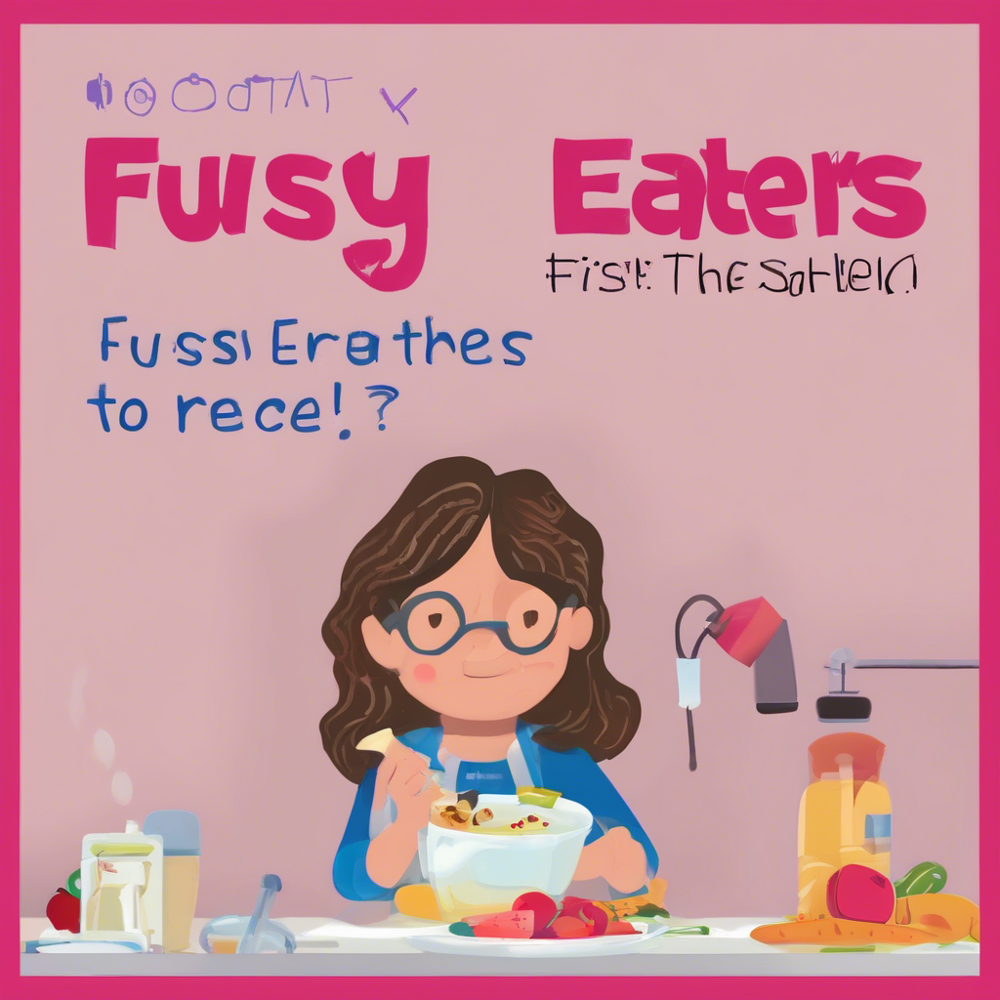

In [23]:
image_generation_with_title(intelligence_feed.entries[1].title)

In [24]:
image_generation_with_description(intelligence_feed.entries[1].description)

Output hidden; open in https://colab.research.google.com to view.

In [25]:
image_generation_with_prompt(intelligence_feed.entries[1].description)

Output hidden; open in https://colab.research.google.com to view.

We have implemented three methods of generating images with varying levels of sophistication. Based on your observations, you can decide which technique works and under which scenarios and also identify aspects that you would like to improve.

It generally works well but we can be more nuanced in our prompting and exercise greater control over how the generated image looks. So far, we have relied on an LLM to help us with generating the image but in the next section, we will understand a high-level structure and methodology to create a better image generation prompt.

# Model Prompting Techniques

In this section, we will follow a structured process for writing our prompt and learn about the different keywords and other aspects that we can control. The high-level approach is as follows -


1. [Specifying the type of image](#scrollTo=YHsYqgs6smp8)
2. [Identifying the subject](#scrollTo=6-oDx3FxuD0H)
3. [Jazzing up the image with modifiers and styles](#scrollTo=SeiyFSGlvh-B)
4. [Adding modifiers, special effects, negative keywords etc.](#scrollTo=O78gjXJcuuYH)

## Step 1 - Specifying the type of image


 Specify the type of photo you want -- A photo, digital illustration, oil painting etc.

In the beginning we used the term `Podcast cover image with ... <scene_description>`. In later steps, we asked ChatGPT to create prompts as a designer and ended with prompts that started with - `Create image of .. <scene_description>`.

However, it's important to state the type of image we want in more specific terms that the models can understand. Let's try a few examples: `movie poster`, `photo`, `digital illustration`, `painting` and so on.

In the section below, we have adapted the `generate_images` function that we used previously and call it `generate_variants`. It takes a base_prompt and a list of additional modifiers and generates two images for each combination to identify the variance by the use of a specific keyword. This is useful to test how our image changes with each set of keywords and is recommended when experimenting with prompts so that you are able to understand the effects of the keywords better.

By default, the index parameter is set to 0. This will keep the base_prompt constant and add the variants at the end of the prompt. Passing any other index values will reverse the order of the combination.

In [26]:
import numpy as np
import matplotlib.pyplot as plt

def generate_variants(base_prompt, variants, index=0):
  images = []
  for i in range(len(variants)):
    for j in range(2):
      seed = np.random.randint(0, 2**32 - 1)
      if (index == 0):
        image = generate_sdxl_base_image(base_prompt + variants[i], seed=seed)
      else:
        image = generate_sdxl_base_image(variants[i] + base_prompt, seed=seed)
      images.append(image)

  fig, axes = plt.subplots(len(variants), 2, figsize=(8, 8))

  for i, image in enumerate(images):
        row, col = i // 2, i % 2
        axes[row, col].imshow(image)
        axes[row, col].axis('off')
  plt.show()

### 👨‍🏫 Learner Task:

Please create a version of your base prompt here and then you can permutate that with different styles of mediums like: `a movie poster`, `a photo`, `digital illustration` etc.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

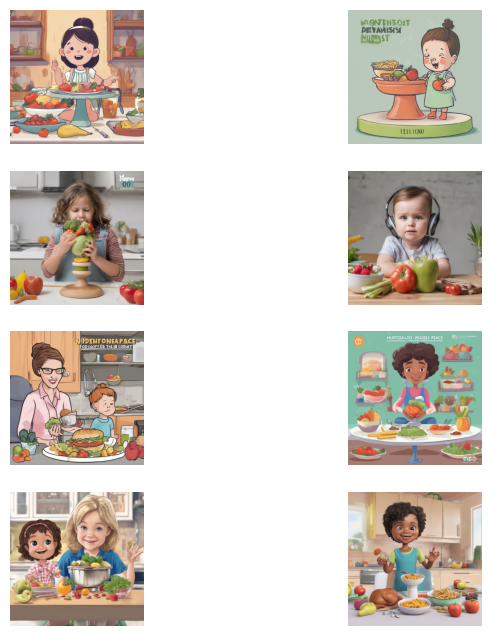

In [28]:
base_prompt = """Generate a podcast cover image for the episode where nutritionist discusses strategies to restore peace during mealtimes and help children enjoy food once again.
She explores the concept of putting food on a pedestal, particularly in relation to toddlers.
"""
generate_variants(base_prompt, ['digital illustration','realistic photo','cartoon','realistic cartoon'], index=1)

We can already see the various styles showing up in the image output. This forms the first and important part of our choice of what type of image we would like to see.

## Step 2 - Identifying the Subject

The next step is the choice of subject (what we had fixed in our base_prompt so far). You might think that the subject is very clear to you but it may not be so clear to the model. Or, there might be other words that provide a much better result than the one you had originally chosen.


A great resource that you can use to understand this would be [Lexica](https://lexica.art/). You can search for the image ideas in your mind and find similar images generated by users and get clues for the subject words you want to include. Please ensure to filter the search results for "Stable Diffusion" as that is the model we are using.

<img src="https://drive.google.com/uc?id=1vG7pIONaFYaulM5hLig-BTyPaqWMBTnS" />

### 👨‍🏫 Learner Task:

Please leverage the medium type that you already selected from the previous step and use that in the `base_prompt` below. Then you can choose different values for the subject that you can permutate with.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

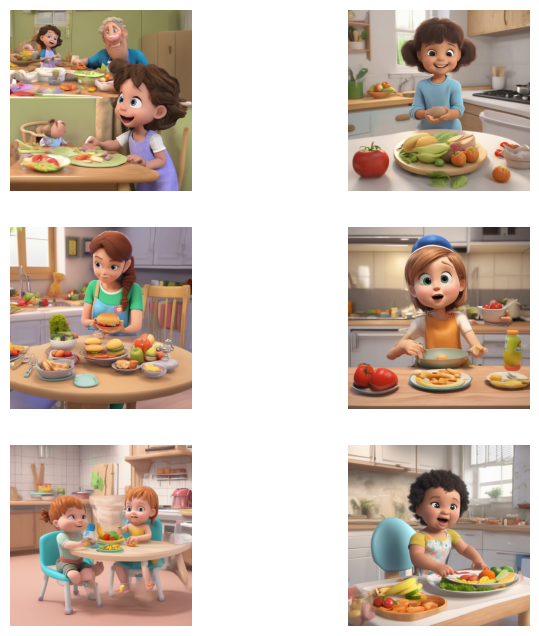

In [31]:
base_prompt = """Generate a realistic, 3d, cartoon for the episode where nutritionist discusses strategies to restore peace during mealtimes and help children enjoy food once again.
She explores the concept of putting food on a pedestal, particularly in relation to toddlers.
"""
generate_variants(base_prompt, ['delighted expression','eating food','baby in a high chair'])

You should be able to find a good combination of your subject and the type of image you want by now. Please iterate with different seeds to check if you are able to come up with more interesting variants.

## Step 3 - Jazzing up the image with lighting and style modifiers

The images might still look plain and now is when we include other elements that can bring our image alive. As you are looking up the images in Lexica, you might notice the use of additional keywords signifying the type of lighting - `spotlight`, `diffused`, `volumetric lighting` etc. Additionally, there might be scene descriptors that you did not add yet - is there a specific place or location where the subject should be - `indoor`, `in the sky` or something specific in the background of the image - `huge crowd`, `snow-capped mountains`.

We are trying to paint a fuller picture at this stage but making sure our subject is highlighted correctly and is in the right environment.

### 👨‍🏫 Learner Task:

You will likely have a new base prompt now based on your decision in the previous steps. In this step, let's use that base prompt but then play around with different modifiers.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

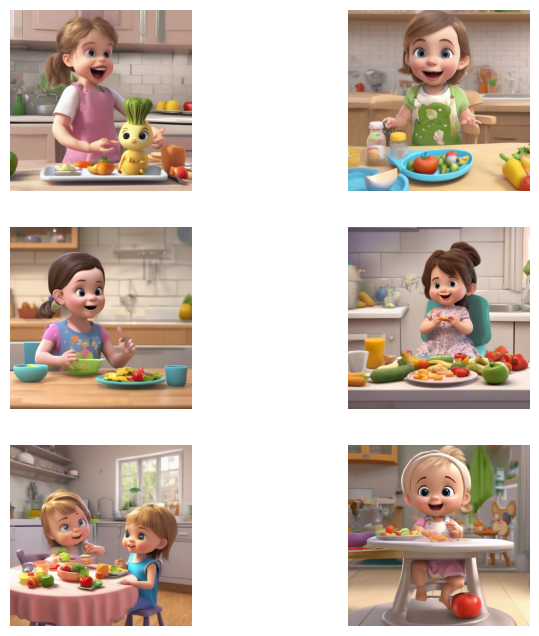

In [36]:
base_prompt = """Generate a realistic, 3d, cartoon for the episode where nutritionist discusses strategies to restore peace during mealtimes and help children enjoy food once again.
She explores the concept of putting food on a pedestal, particularly in relation to toddlers.
Include a cute baby girl with a delighted expression eating healthy food in a high chair.
"""
generate_variants(base_prompt, ['kitchen in the background','spotlight',"well shaded"])

It's not necessary that the results work well with your first attempt. It may also be possible that you have already decided your MEDIUM_STYLE so you do not need to provide a list. Feel free to adapt the `generate_variants` function to test the different keywords that you are experimenting with.

## Step 4 - Adding keywords, special effects, negative keywords etc.

We are now very close to how our image should look like and this stage is where we can choose from a variety of additional keywords that denote special effects. For example, you can specify what type of lens or and shot you would like which can drastically affect the quality and look and feel of the image. This stage is one of the most important learnings when working with StableDiffusion - **addition of modifiers is really important to get high-quality images**.

You can add many other types of modifiers to make the images pop. Some of these include

- image descriptors like `4K`, `hyperrealistic`, `highly detailed`
- shot types like `product shot`, `potraits`
- art medium types like `water colors`, `oil painting`, `artwork`
- artists like `Alejandro Bursido`, `Ansel Adams`, `Emerson Tung`
- mood/feeling descriptors like `gloomy`, `vibrant`, `historic`

We are firmly in experimentation mode. The best image is purely subjective and can involve a lot of hit & trial. For the podcast cover please try with various options and see what works in your case.

### 👨‍🏫 Learner Task:

Finally, this is the time to try various options to see the impact of various keywords. Use the base_prompt that you have created and then test the impact of the different keywords.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

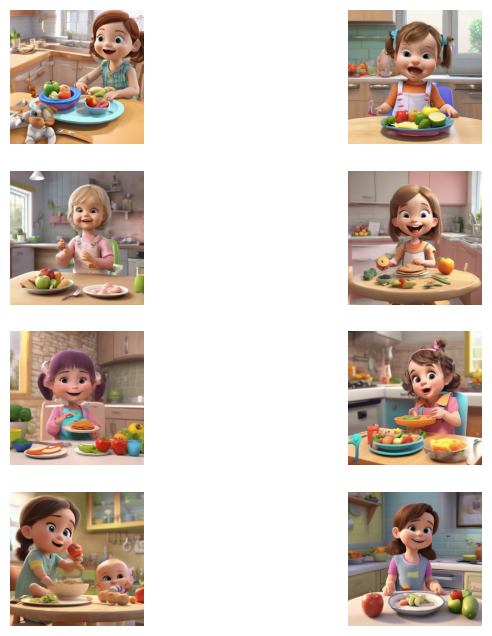

In [37]:
base_prompt = """Generate a realistic, 3d, cartoon for the episode where nutritionist discusses strategies to restore peace during mealtimes and help children enjoy food once again.
She explores the concept of putting food on a pedestal, particularly in relation to toddlers.
Include a cute baby girl with a delighted expression eating healthy food in a high chair with a kitchen in the background.
"""
generate_variants(base_prompt, ['highly detailed','smooth','stunning color scheme','pixar'])


At this point you might also notice that adding too many modifiers doesn't make as much impact. So while the use of modifiers is very important, stuffing your prompt with them is also not sensible.

This leads us to another important principle - **Order Matters**. The weight of a token at the beginning of a sentence is much larger than a token towards the end. So when designing prompts, ensure that the most important elements of the desired image is placed further ahead and other types of modifiers and styles are placed towards the end.

### Dealing with unwanted artifacts like text and limbs

Many times, the generated image can have artifacts like ill-formed limbs, garbled text etc. You can make use of the `negative_prompt` argument to pass in additional keywords that you would not like to see in the images. You can do that in the following way (we did not include this in the `generate_variants` function itself)

### 👨‍🏫 Learner Task:

In case your image has some weird artifacts then you can make use of negative keywords to remove them from generated images.

  0%|          | 0/50 [00:00<?, ?it/s]

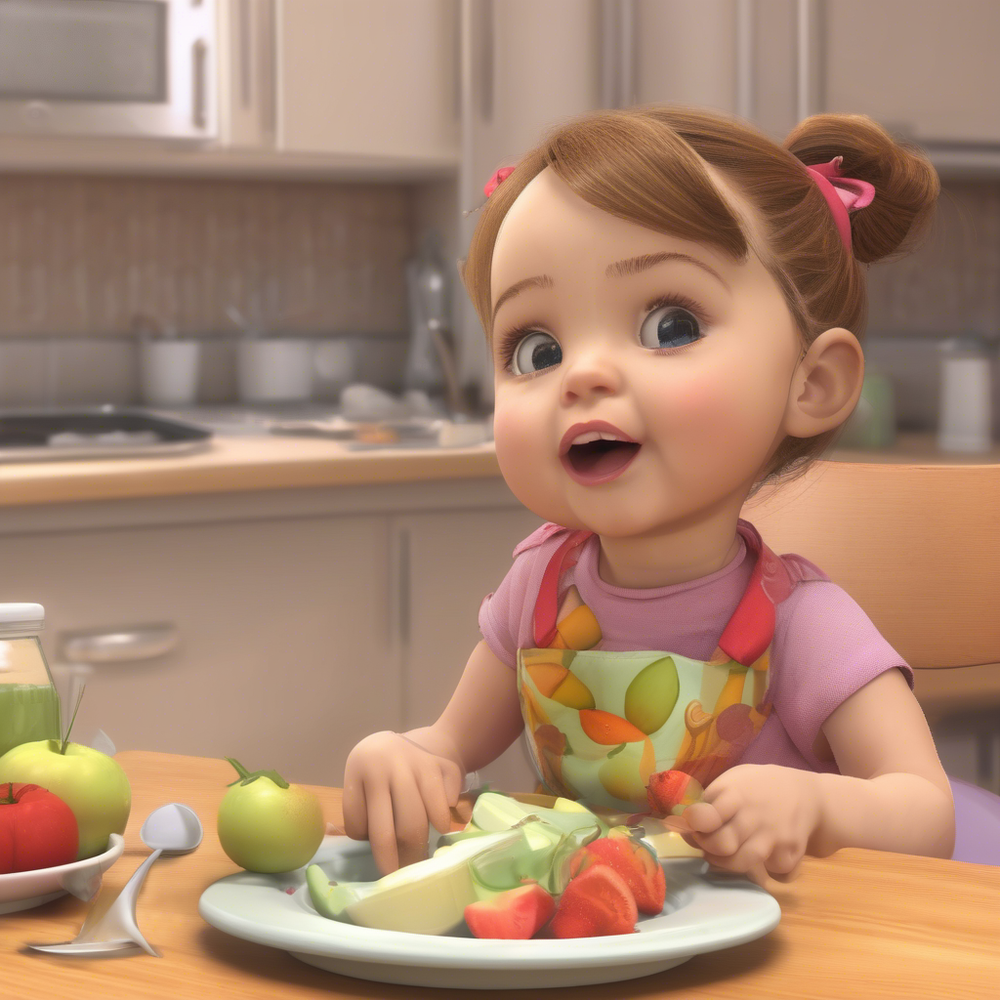

In [38]:
torch.manual_seed("42")
prompt_neg="""Generate a realistic, 3d, cartoon for the episode where nutritionist discusses strategies to restore peace during mealtimes and help children enjoy food once again.
She explores the concept of putting food on a pedestal, particularly in relation to toddlers.
Include a cute baby girl with a delighted expression eating healthy food in a high chair with a kitchen in the background.  """
base_sdxl(prompt=prompt_neg, negative_prompt="text").images[0]

## Creating a Prompt Designer

You can see that the techniques we used follow a trial-and-error approach. It's not clear which set of keywords work better in generating a good image and also identifying what is **good** is not easy. It's best to leave this to the host of the podcast or an editor to make a selection from multiple options.

How should we make this a product?

In the following section, we will make use of chatGPT to assist us in prompt generation. Our goal is to write a function that can generate multiple options variants of images that could fit as the cover image of a podcast episode. Once that is done, we can provide these options to an editor to make a selection or generate more variants in that particular style.

We start by adapting chatGPT to perform the role of a prompt engineer. We ask it follow a certain formula and once confirmed, we can keep providing it with different types of subjects, art mediums and generate multiple image options.

### 👨‍🏫 Learner Task:

In the below LLM prompt, please get help from the LLM to follow a more rules driven approach to creating a prompt. This is a different approach to our earlier attempts and brings a certain randomness and variability to the generated images.

In [39]:
instructPrompt = """
You are a prompt designer tasked with creating a digital image for a podcast episode.
The podcast episode is titled 'Fussy Eaters - Dr Janet Aylott to the rescue!'
The prompt should instruct to design a vibrant, eye-catching image that clearly represents the episode's theme.
The goal is to attract viewers by creating a realistic, 3d, cartoon design capturing the essence of healthy eating and the parental experience during the weaning process.
"""

In [40]:
episodeSummary="""Join us for an amazing podcast with Nutritionist Dr Janet Aylott as she walks us through how to restore peace at mealtimes and get your child enjoying food again.
Are you putting food on a pedestal? Honestly this is our favourite concept surrounding food with toddlers."""

In [41]:
requestMessage = instructPrompt + episodeSummary

In [42]:
requestMessage

"\nYou are a prompt designer tasked with creating a digital image for a podcast episode.\nThe podcast episode is titled 'Fussy Eaters - Dr Janet Aylott to the rescue!' \nThe prompt should instruct to design a vibrant, eye-catching image that clearly represents the episode's theme. \nThe goal is to attract viewers by creating a realistic, 3d, cartoon design capturing the essence of healthy eating and the parental experience during the weaning process.\nJoin us for an amazing podcast with Nutritionist Dr Janet Aylott as she walks us through how to restore peace at mealtimes and get your child enjoying food again.  \nAre you putting food on a pedestal? Honestly this is our favourite concept surrounding food with toddlers."

In [43]:
chatOutput = client.chat.completions.create(model="gpt-4o-mini",
                                            messages=[{"role": "system", "content": "You are a helpful assistant."},
                                                      {"role": "user", "content": instructPrompt}
                                                      ]
                                          )

imagePrompt = chatOutput.choices[0].message.content

In [44]:
imagePrompt

'**Prompt for Digital Image Design:**\n\nCreate a vibrant, eye-catching 3D cartoon-style illustration for the podcast episode titled "Fussy Eaters - Dr Janet Aylott to the Rescue!" \n\n1. **Focus Elements:**\n   - **Central Character**: Feature a friendly, animated version of Dr. Janet Aylott, depicted as an approachable and caring nutritionist. She should be smiling and engaging with the viewer, perhaps holding a colorful plate of healthy food options.\n   - **Fussy Eaters**: Include a diverse group of playful cartoon children sitting at a table, showcasing varying expressions of curiosity, joy, and a hint of skepticism towards the healthy foods presented before them. \n\n2. **Healthy Foods**: \n   - Illustrate a variety of vibrant, appealing healthy foods on the table, such as fruits, vegetables, whole grains, and fun meal presentations (e.g., animal-shaped sandwiches or colorful smoothie bowls) that can intrigue children.\n\n3. **Background Setting**: \n   - Create a bright, invitin

Since this is another style of generating images for us, let's also implement this as a modular function that can be called by the front-end of our product.

In [47]:
def image_generation_with_formula(episode_description):
  episodeSummary = get_episode_summary(episode_description)
  instructPrompt = """
      You are an expert graphics designer and have to describe an image using the following formula:
      A realistic, 3d, cartoon of nutritionist Dr Janet Aylott holding a colorful plate of healthy food in a kitchen with a diverse group of playful cartoon children sitting at a table.
      Additional rules you must follow:
      - The final image description must be only one sentence, not long and fit within 100 characters.
      - Please generate only the image description and nothing else.
      - You will be provided with a description of a podcast episode that contains information on what was discussed in the episode.
      - Extract the necessary elements for the image formula from the podcast description
      - The most important elements you should focus on extracting are healthy food and children sitting at a table so that you can capture the most important aspects of the episode in the image

      Please generate only the image description and nothing else based on the podcast description -

      """
  requestMessage = instructPrompt + episodeSummary
  chatOutput = client.chat.completions.create(model="gpt-4o-mini",
                                            messages=[{"role": "system", "content": "You are a helpful assistant."},
                                                      {"role": "user", "content": instructPrompt}
                                                      ]
                                          )
  imagePrompt = chatOutput.choices[0].message.content
  print (imagePrompt)
  return (generate_sdxl_base_image(imagePrompt))

In [48]:
image_generation_with_formula(intelligence_feed.entries[1].description)

Output hidden; open in https://colab.research.google.com to view.

# Deployment

We have now created four ways of generating images with varying levels of sophistication. Let's put this functionality into our product by designing a quick Gradio based front-end that can be used by anyone.

It's actually a very simple app that accepts the RSS feed of the podcast as the input and generates visuals for the latest podcast episode. We call each of the functions that we defined so far and then display the images in a grid.

In [ ]:
import gradio as gr

def create_podcast_images(podcast_rss_url):
  podcast_images = []
  podcast_feed = feedparser.parse(podcast_rss_url)
  image_1 = image_generation_with_title(podcast_feed.entries[0].title)
  podcast_images.append(image_1)
  print ("Image 1 has been generated")
  image_2 = image_generation_with_description(podcast_feed.entries[0].description)
  podcast_images.append(image_2)
  print ("Image 2 has been generated")
  image_3 = image_generation_with_prompt(podcast_feed.entries[0].description)
  podcast_images.append(image_3)
  print ("Image 3 has been generated")
  image_4 = image_generation_with_formula(podcast_feed.entries[0].description)
  podcast_images.append(image_4)
  print ("Image 4 has been generated")
  return (podcast_images)

with gr.Blocks() as demo:
  podcast_rss = gr.Textbox(label="podcast_rss")
  generate_images_button = gr.Button("Generate Podcast Images")
  gallery = gr.Gallery(label="Generated images", show_label=False, elem_id="gallery" , columns=[2], rows=[2], object_fit="contain", height="auto")

  generate_images_button.click(fn=create_podcast_images, inputs=[podcast_rss], outputs=gallery, api_name="generate_podcast_images")

demo.launch(debug=True)

Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://e34792e844b5eaa561.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Podcast cover image with title - Weaning your Baby with Dr Janet Aylott


  0%|          | 0/50 [00:00<?, ?it/s]

Image 1 has been generated
Podcast cover image for In this episode, Dr. Janet Aylott, our resident Nutritionist, discusses the weaning process for children. She provides valuable insights on fostering healthy relationships with food for young ones.


  0%|          | 0/50 [00:00<?, ?it/s]

Image 2 has been generated
The album cover features a colorful, whimsical illustration of a joyful child sitting at a small table filled with vibrant fruits and vegetables, while a friendly, smiling Dr. Janet Aylott gently guides the child with a nurturing hand, surrounded by soft, pastel hues that evoke warmth and positivity, encapsulating the theme of healthy eating and nurturing relationships with food.


  0%|          | 0/50 [00:00<?, ?it/s]

Image 3 has been generated
A realistic, 3D cartoon of Dr. Janet Aylott holding a colorful plate of healthy food with joyful children at a table.


  0%|          | 0/50 [00:00<?, ?it/s]

Image 4 has been generated


We have built PodPicasso that should help any podcast producer the ability to pick visuals for their latest podcast. When building a GenAI product such as this, you must remember that the result is very subjective and you must give the option to make the final choice or even tweak and adapt as required.

We provide below two extensions for this product that can be very helpful to users of this product. I'm sure there are several more ideas that come into your mind and I look forward to seeing your creativity in the project submissions.

# [Optional] Extensions

## Extension 1 - Generating podcast cover art that follow certain design templates

Often times, podcast cover images follow certain pre-designed templates. This might include brand logos and other design elements. We can easily incorporate this into our product as well through a technique known as ControlNet.

In the following example, we use the same SDXL base model to generate our podcast cover art but we generate it in the style of an existing template.

In [ ]:
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, AutoencoderKL
from diffusers.utils import load_image
import numpy as np
import torch

import cv2
from PIL import Image

# initialize the models and pipeline
controlnet = ControlNetModel.from_pretrained("diffusers/controlnet-canny-sdxl-1.0", torch_dtype=torch.float16)
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0",
                                                           controlnet=controlnet,
                                                           vae=vae, torch_dtype=torch.float16
                                                           )
pipe.to("cuda")

In [ ]:
# download the template that the user would like to use
image = load_image(
    "/content/Screenshot.jpg"
)

In [ ]:
# get canny image
image = np.array(image)
image = cv2.Canny(image, 100, 200)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)

In [ ]:
canny_image

You can see what the canny edge detection algorithm does - by creating an outline of the template. The actual edge detection may vary depending on your template but sharper contrast images work well, which is typically how you can imagine templates to be designed.

In [ ]:
prompt = "A vibrant and abstract artwork showcasing the interconnection between chemistry, artificial intelligence, and the potential discovery of alien life forms."
negative_prompt = "low quality, bad quality, sketches"

# generate image
image = pipe(
    prompt,
    controlnet_conditioning_scale=0.5,
    image=canny_image,
    negative_prompt=negative_prompt
).images[0]

In [ ]:
image

You can see that the generated image uses the prompt to generate the image but within the constraints of the canny image. This allows you to superimpose your template on a generated image in a more nuaced way than just embossing the template or logo directly.

## Extension 2 - Deploy Image Generation cloud functions

While you can easily deploy the Gradio that we created to HuggingFace, it would not work perfectly without upgrading to a premium HF account in order to access GPUs. Here we provide an alternate solution by making use of Modal Labs where you can easily deploy a cloud function, get access to GPUs and only pay for usage.

Integrating it into our existing code is also very easy because we only need to change the function call to use the deployed instance instead of the function running in Google Colab.

In [ ]:
!pip install modal

In [ ]:
!modal token set --token-id TOKEN_ID --token-secret TOKEN_SECRET

In [ ]:
%%writefile /content/image_generation_backend.py

# Setting up the container parameters
# We download the SDXL Turbo model at startup time

from pathlib import Path
from modal import Image, Stub, gpu, method

# ## Define a container image
def download_models():
    from huggingface_hub import snapshot_download

    # Ignore files that we don't need to speed up download time.
    ignore = [
        "*.bin",
        "*.onnx_data",
        "*/diffusion_pytorch_model.safetensors",
    ]

    snapshot_download("stabilityai/sdxl-turbo", ignore_patterns=ignore)


image = (
    Image.debian_slim()
    .pip_install(
        "Pillow~=10.1.0",
        "diffusers~=0.24",
        "transformers~=4.35",  # This is needed for `import torch`
        "accelerate~=0.25",  # Allows `device_map="auto"``, which allows computation of optimized device_map
        "safetensors~=0.4",  # Enables safetensor format as opposed to using unsafe pickle format
    )
    .run_function(download_models)
)

stub = Stub("stable-diffusion-xl-turbo", image=image)

# Here we are defining the Image Generation class and methods
@stub.cls(gpu=gpu.A10G(), container_idle_timeout=240)
class Model:
    def __enter__(self):
        import torch
        from diffusers import AutoPipelineForText2Image

        self.pipe = AutoPipelineForText2Image.from_pretrained(
            "stabilityai/sdxl-turbo",
            torch_dtype=torch.float16,
            variant="fp16",
            device_map="auto",
        )

    @method()
    def inference(self, prompt):
        from io import BytesIO

        from diffusers.utils import load_image
        from PIL import Image

        num_inference_steps = 4
        strength = 0.9
        # "When using SDXL-Turbo for image-to-image generation, make sure that num_inference_steps * strength is larger or equal to 1"
        # See: https://huggingface.co/stabilityai/sdxl-turbo
        assert num_inference_steps * strength >= 1

        image = self.pipe(
            prompt,
            num_inference_steps=num_inference_steps,
            strength=strength,
            guidance_scale=0.0,
        ).images[0]

        byte_stream = BytesIO()
        image.save(byte_stream, format="PNG")
        image_bytes = byte_stream.getvalue()

        return image_bytes

## This is only a local function that shows us how to test the remote function
@stub.local_entrypoint()
def main(prompt="dog wizard, gandalf, lord of the rings, detailed, fantasy, cute, adorable, Pixar, Disney, 8k",):
  output_image_bytes = Model().inference.remote(prompt)
  dir = Path("/tmp/stable-diffusion-xl-turbo")
  if not dir.exists():
    dir.mkdir(exist_ok=True, parents=True)

  output_path = dir / "output.png"
  print(f"Saving it to {output_path}")
  with open(output_path, "wb") as f:
    f.write(output_image_bytes)

In [ ]:
modal run /content/image_generation_backend.py --prompt="A vibrant and abstract artwork showcasing the interconnection between chemistry, artificial intelligence, and the potential discovery of alien life forms."

In [ ]:
!modal deploy /content/image_generation_backend.py

In [ ]:
f = modal.Function.lookup("stable-diffusion-xl-turbo", "Model.inference")
output = f.remote("The album cover image depicts a visually dynamic and abstract representation of a chemical reaction, merging with cosmic elements and futuristic technology, symbolizing the diverse and thought-provoking topics discussed in the podcast episode.")

In [ ]:
# Convert bytes data to an Image object
image = Image.open(io.BytesIO(output))

# To display the image in a Jupyter notebook, for example
print (type(image))
display(image)

In [ ]:
import feedparser
import gradio as gr
import modal
from openai import OpenAI
from PIL import Image
import io
from google.colab import userdata

client = OpenAI(api_key=userdata.get('OPENAI_API_KEY'))

def generate_image(input_prompt):
  f = modal.Function.lookup("stable-diffusion-xl-turbo", "Model.inference")
  output = f.remote(input_prompt)
  image = Image.open(io.BytesIO(output))
  return (image)

def image_generation_with_title(episode_title):
  image_prompt = "Podcast cover image with title - " + episode_title
  print (image_prompt)
  return generate_image(image_prompt)

def get_episode_summary(episode_description):
  instructPrompt = """
      The following section contains the description of a podcast episode but it also includes a lot of irrelevant information like
      social media links, sponsor information, podcast player links, HTML tags, timestamps etc. Can you please remove irrelevant information and return only a summary that
      describes the podcast episode?
      """
  requestMessage = instructPrompt + '\n' + episode_description
  chatOutput = client.chat.completions.create(model="gpt-4o-mini",
                                                messages=[{"role": "system", "content": "You are a helpful assistant."},
                                                          {"role": "user", "content": requestMessage}
                                                          ]
                                                )
  return (chatOutput.choices[0].message.content)

def image_generation_with_description(episode_description):
  episode_summary = get_episode_summary(episode_description)
  image_prompt = "Podcast cover image for " + episode_summary
  print (image_prompt)
  return generate_image(image_prompt)

def image_generation_with_prompt(episode_description):
  episode_summary = get_episode_summary(episode_description)
  instructPrompt = """
    Assume that you are a professional graphic art designer and artist. You have to design the album cover art for a podcast episode where you are given
    a brief summary of the host and the topics that are discussed in the podcast. You need to describe your idea for the album cover image very concisely
    in just one sentence and please limit yourself to 100 words. Please provide the image description only and none of your thoughts and ideas.
    Here are the details of the podcast episode -
    """
  requestMessage = instructPrompt + '\n' + episode_summary
  chatOutput = client.chat.completions.create(model="gpt-4o-mini",
                                                messages=[{"role": "system", "content": "You are a helpful assistant."},
                                                          {"role": "user", "content": requestMessage}
                                                          ]
                                                )
  image_prompt = chatOutput.choices[0].message.content
  print (image_prompt)
  return generate_image(image_prompt)

def image_generation_with_formula(episode_description):
  episode_summary = get_episode_summary(episode_description)
  instructPrompt = """
      You are an expert graphics designer and have to describe an image using the following formula:
      A [type of visual art] of [subject] [doing something interesting] in a [location], with [type of lighting],[type of shot] taken with a [type of camera], using [type of lens]

      Additional rules you must follow:
      - The final image description must be only one sentence, not long and fit within 100 characters.
      - Please generate only the image description and nothing else.
      - You will be provided with a description of a podcast episode that contains information on what was discussed in the episode.
      - Extract the necessary elements for the image formula from the podcast description
      - The most important elements you should focus on extracting are [subject] and [location] so that you can cpature the most important aspects of the episode in the image

      Please generate only the image description and nothing else based on the podcast description -

      """
  requestMessage = instructPrompt + episode_summary
  chatOutput = client.chat.completions.create(model="gpt-4o-mini",
                                            messages=[{"role": "system", "content": "You are a helpful assistant."},
                                                      {"role": "user", "content": instructPrompt}
                                                      ]
                                          )
  imagePrompt = chatOutput.choices[0].message.content
  print (imagePrompt)
  return generate_image(imagePrompt)

def create_podcast_images(podcast_rss_url):
  podcast_images = []
  podcast_feed = feedparser.parse(podcast_rss_url)
  image_1 = image_generation_with_title(podcast_feed.entries[0].title)
  podcast_images.append(image_1)
  print ("Image 1 has been generated")
  image_2 = image_generation_with_description(podcast_feed.entries[0].description)
  podcast_images.append(image_2)
  print ("Image 2 has been generated")
  image_3 = image_generation_with_prompt(podcast_feed.entries[0].description)
  podcast_images.append(image_3)
  print ("Image 3 has been generated")
  image_4 = image_generation_with_formula(podcast_feed.entries[0].description)
  podcast_images.append(image_4)
  print ("Image 4 has been generated")
  return (podcast_images)

with gr.Blocks() as demo:
  podcast_rss = gr.Textbox(label="podcast_rss")
  generate_images_button = gr.Button("Generate Podcast Images")
  gallery = gr.Gallery(label="Generated images", show_label=False, elem_id="gallery" , columns=[2], rows=[2], object_fit="contain", height="auto")

  generate_images_button.click(fn=create_podcast_images, inputs=[podcast_rss], outputs=gallery, api_name="generate_podcast_images")

demo.launch(debug=True)